# Airbnb Analysis 

We are going to analyse by using the Airbnb dataset from kaggle. This data set can be obtained in
<href>https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data</href>

There are a number of questions that we will try to answer by analysing the data. 

### Questions to answer.

What are the landlords with the highest number of houses?

Do the neighbourhood and neighbourhood group have a correlation with the price of rent?

How many houses are per neighbourhood and neighbourhood group areas?

What are the types of rooms broken down by neighbourhood group? 

Can we predict the price of a home based on the area is in?



## Loading the dataset

We first will be loading the dataset. I assume that the dataset is in the same folder as the notebook.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
## Load Data
airbnbData = pd.read_csv('AB_NYC_2019.csv')

print(len(airbnbData))

## check the first 10 rows to see what columns are there

airbnbData.head()

48895


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


## 2. Dealing with na and duplicates values

In this part we will be dealing with na values and removing them.

1. Check if there are any null values.
2. find a ratio of the amount of null values between total rows.
3. remove the columns that have more than 25.0 and fill those that have less using the mean
4. Eliminate duplicate rows

In [2]:
# check if there are any na values
print("sum of null values per column")
print(airbnbData.isnull().sum())
# print rows where there are na values
airbnbData[airbnbData.isnull() == True]


sum of null values per column
id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
airbnbData.duplicated().sum()
airbnbData.drop_duplicates()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [4]:
airbnbData.shape


(48895, 16)

In [5]:
# find the ratio of nulls compared to total rows.
nullRatios = {}

for val in list(airbnbData.columns.values):
    nullValuesCol = airbnbData[val].isnull().sum()
    totalCol = len(airbnbData[val])

    ratio = (nullValuesCol / totalCol) * 100
    
    if ratio > 0:
        nullRatios[val] = ratio

# print values 
for k, v in nullRatios.items():
    print('Column {key} has a ratio of {value}'.format(key = k, value = v))
    print(k)


Column name has a ratio of 0.03272318232948154
name
Column host_name has a ratio of 0.04294917680744453
host_name
Column last_review has a ratio of 20.55833929849678
last_review
Column reviews_per_month has a ratio of 20.55833929849678
reviews_per_month


In [6]:
print("sum of null values per column")
print(airbnbData.isnull().sum())

sum of null values per column
id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


In [7]:
meanv = airbnbData.mean(axis=1, skipna=True)

minPercent = 20.0
print(airbnbData.columns.values)
for k, v in nullRatios.items():

    print(k)
    
    if v > minPercent:
        airbnbData.drop(str(k), 1, inplace=True)
        print(airbnbData.columns.values)
        
    else: 
        airbnbData.fillna(value={k: meanv}, inplace=True)

print("sum of null values per column")
print(airbnbData.isnull().sum())

['id' 'name' 'host_id' 'host_name' 'neighbourhood_group' 'neighbourhood'
 'latitude' 'longitude' 'room_type' 'price' 'minimum_nights'
 'number_of_reviews' 'last_review' 'reviews_per_month'
 'calculated_host_listings_count' 'availability_365']
name
host_name
last_review
['id' 'name' 'host_id' 'host_name' 'neighbourhood_group' 'neighbourhood'
 'latitude' 'longitude' 'room_type' 'price' 'minimum_nights'
 'number_of_reviews' 'reviews_per_month' 'calculated_host_listings_count'
 'availability_365']
reviews_per_month
['id' 'name' 'host_id' 'host_name' 'neighbourhood_group' 'neighbourhood'
 'latitude' 'longitude' 'room_type' 'price' 'minimum_nights'
 'number_of_reviews' 'calculated_host_listings_count' 'availability_365']
sum of null values per column
id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                     

## Finding Outsiders between columns

We will try to find outsiders between columns by:
1. observing how many outsiders the data has for each column on a boxplot. 
2. getting the mean, standard deviation, and other stats.
3. delete outsiders

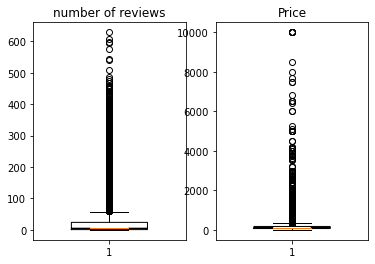

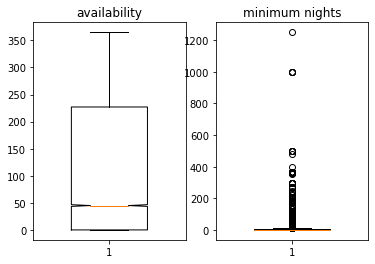

In [8]:
priceCol, reviews = airbnbData['price'], airbnbData['number_of_reviews']
availability, minNights = airbnbData['availability_365'], airbnbData['minimum_nights']
fig, (ax1, ax2) =  plt.subplots(1, 2)
ax1.set_title('number of reviews')
ax1.boxplot(reviews, 20, widths=0.50)

ax2.set_title('Price')
ax2.boxplot(priceCol, 20, widths=0.50)

plt.show()

fig, (ax1, ax2) =  plt.subplots(1, 2)
ax1.set_title('availability')
ax1.boxplot(availability, 20, widths=0.50)

ax2.set_title('minimum nights')
ax2.boxplot(minNights, 0, widths=0.50)

plt.show()

We will create boolean columns that will be used as a mask to delete the outsiders

In [9]:
# create new columns, filled with 0s
airbnbData['isOutlierPrice'] = 0 
airbnbData['isOutlierNumberReviews'] = 0
airbnbData['isOutlierAvailability'] = 0
airbnbData['isOutlierMinNights'] = 0

# calculate the mean and standard deviations
meanPrice = priceCol.mean()
stdDevPrice = priceCol.std()

meanReviews = reviews.mean()
stdDevReviews = reviews.std()

meanAvailability = availability.mean()
stdDevAvailability = availability.std()

meanMinNights = minNights.mean()
stdDevMinNights = minNights.std()

# set outsiders to 1

airbnbData.loc[abs(priceCol - meanPrice) > 2 * stdDevPrice,'isOutlierPrice'] = 1
airbnbData.loc[abs(reviews - meanReviews) > 2 * stdDevReviews,'isOutlierNumberReviews'] = 1
airbnbData.loc[abs(availability - meanAvailability) > 2 * stdDevAvailability,'isOutlierAvailability'] = 1
airbnbData.loc[abs(minNights - meanMinNights) > 2 * stdDevMinNights,'isOutlierMinNights'] = 1


In [10]:
#This counts the unique values
from collections import Counter
print(Counter(airbnbData['isOutlierPrice']))
print(Counter(airbnbData['isOutlierNumberReviews']))
print(Counter(airbnbData['isOutlierAvailability']))
print(Counter(airbnbData['isOutlierMinNights']))

Counter({0: 48128, 1: 767})
Counter({0: 46399, 1: 2496})
Counter({0: 48895})
Counter({0: 48428, 1: 467})


Removing outsiders based on the indexes

In [11]:

priceOutliers = airbnbData[airbnbData['isOutlierPrice'] == 1].index

airbnbData.drop(priceOutliers, inplace=True)

reviewsOutliers = airbnbData[airbnbData['isOutlierNumberReviews'] == 1].index
airbnbData.drop(reviewsOutliers, inplace=True)

avalOutliers = airbnbData[airbnbData['isOutlierAvailability'] == 1].index
airbnbData.drop(avalOutliers, inplace=True)

minNightsOutliers = airbnbData[airbnbData['isOutlierMinNights'] == 1].index
airbnbData.drop(minNightsOutliers, inplace=True)

In [12]:
airbnbData.shape

(45204, 18)

Removing boolean columns to analyse the relationships between columns and see distributions for each column.

In [13]:
airbnbData.drop(['isOutlierPrice', 'isOutlierNumberReviews', 'isOutlierAvailability', 'isOutlierMinNights'], axis=1, inplace=True)

## Find relationships between columns

We will try to find relationships between columns by:
1. observing how the data is distributed for each column
2. plotting a correlation matrix taking into account outsiders
3. plotting in to find relationships between different columns.

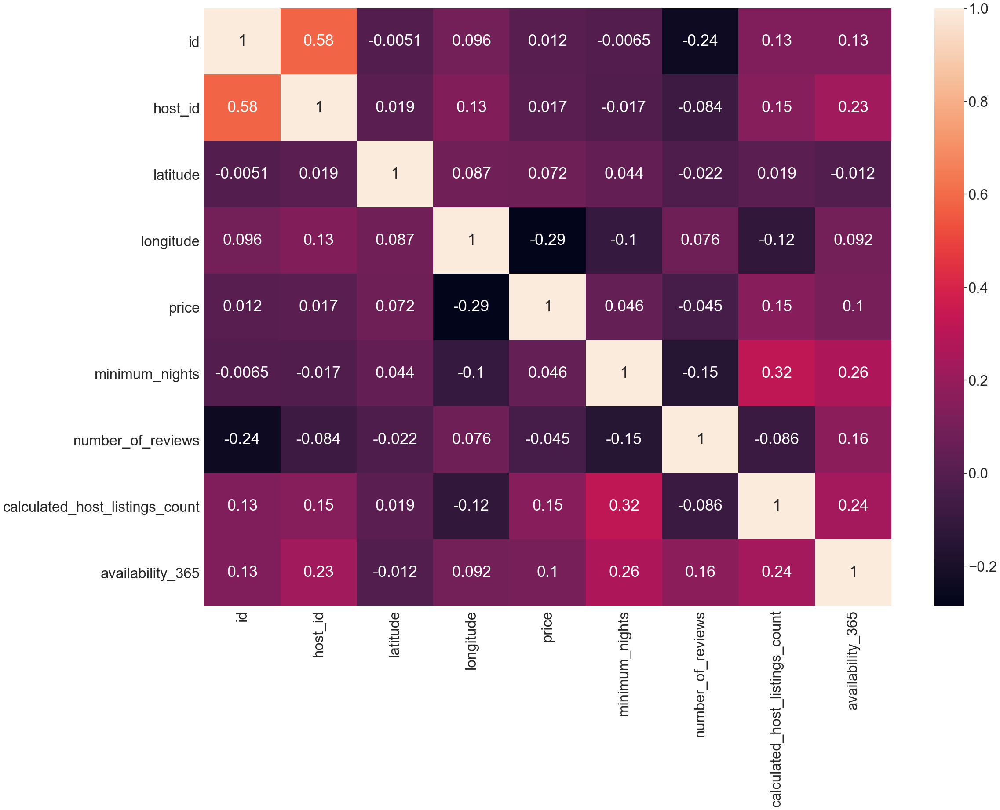

In [14]:
## Select rows to compare  and find relationships between rows
lanlordCol, neighbourhood = airbnbData['name'].unique(), airbnbData['neighbourhood']

#neighbourhood = airbnbData['neighbourhood'].unique()

landlord_name, host_id = airbnbData['name'].unique(), airbnbData['host_id'].unique()
availability, minNights = airbnbData['availability_365'], airbnbData['minimum_nights']    

##  find correlations between columns using a correlation matrix
sns.set(font_scale=3)
plt.figure(figsize=(35, 25))
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

sns.heatmap(airbnbData.corr(method='pearson'), annot=True)

We can observe using a correlation matrix the correlation between every column. 

- Price has a 15% correlation with the calculated_host_listings_count and a 10% correlation with availability.

- The longitud and latitude have a 87% correlation.

- Minimum night have a correlation of 26% with availability_365 and 32% with calculated_host_listings_count

- Number of reviews have a correlation of 16% with availability_365 

- id have a correlation of 58% with host_id and 15% with calculated_host_listings_count

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd902eb35e0>,
      dtype=object)

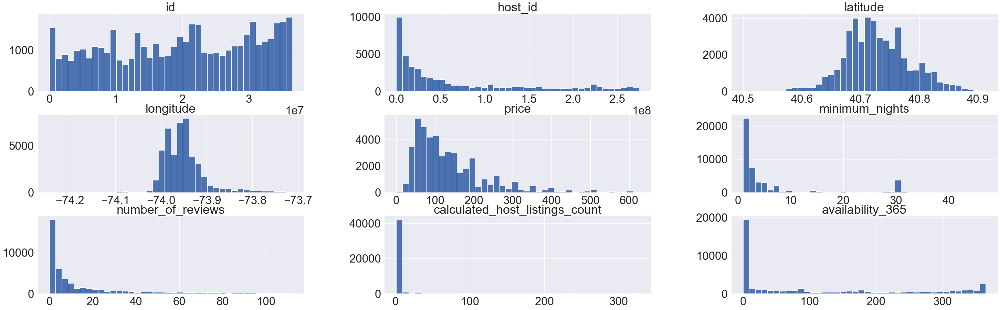

In [15]:

#Show distributions of every column

airbnbData.hist(bins=40, figsize=(50, 15))

<Figure size 2160x2160 with 0 Axes>

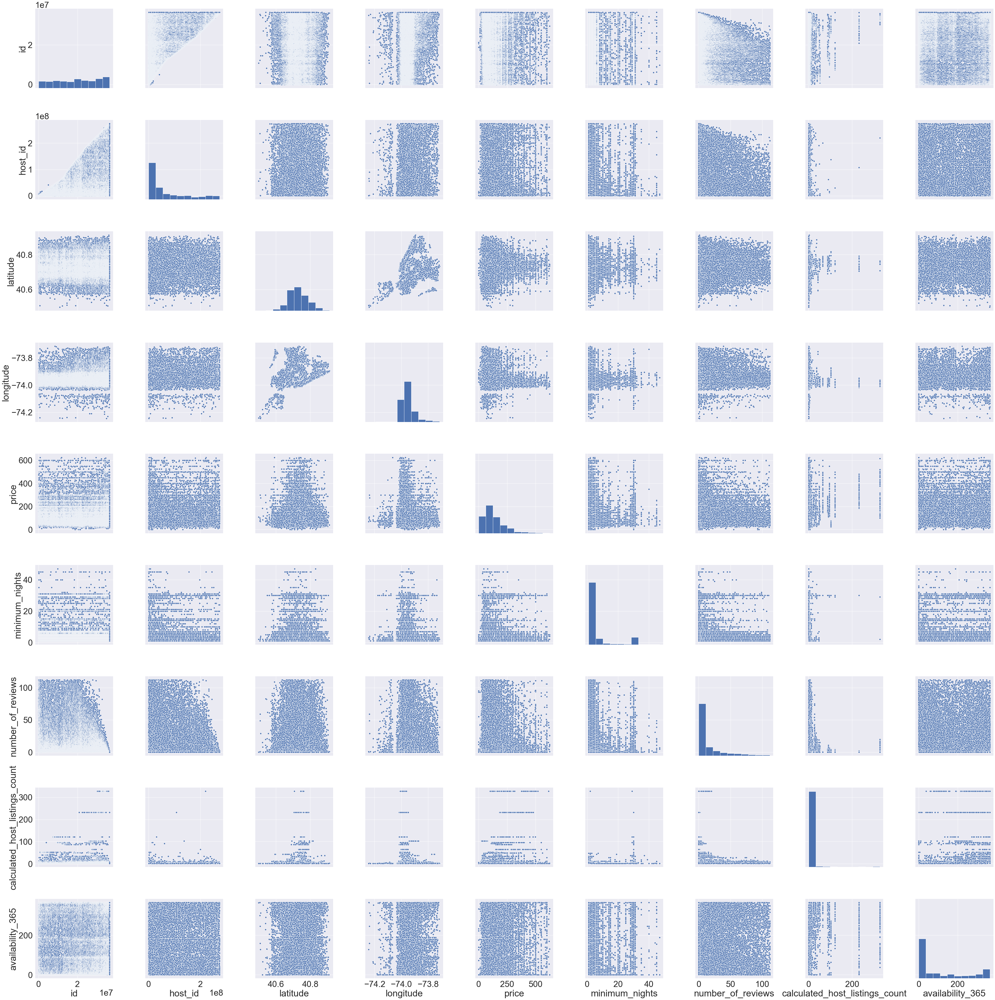

In [16]:
plt.figure(figsize=(30, 30))
sns.pairplot(airbnbData, height=6, diag_kind="hist")



## Conclussions

From the pairplot we can see the histograms of all the columns.

<b>Correlation between longitud and latitud </b>
We can see that it gives new york map.

<b> Correlation between number of reviews and price</b>
We can see that as the price increases, the number of reviews decreases. Which does make sense, as less people can pay less people can post reviews.

## What are the landlords with the highest number of houses?

We will list the landlords assuming that every row that has the name landlord is a home that he wants to rent.



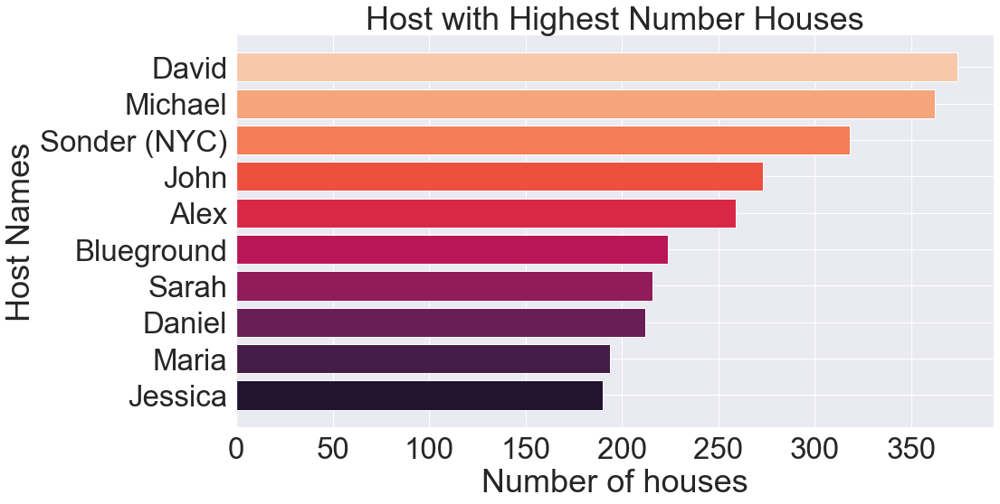

In [17]:
def plot_bar(data, figsize, title, x_label, y_label,  horizontal = False):
    
    plt.figure(figsize=figsize)
    x = list(data.index)
    y = list(data.values)
    plt.title(title)
    
    plt.xlabel(x_label)
    plt.ylabel(y_label)
        
    if horizontal:
        x.reverse()
        y.reverse()
        plt.barh(x, y, color=sns.color_palette('rocket', len(x)))

    else:
        plt.bar(x, y, color=sns.color_palette('rocket', len(x)))
      
    plt.show()

top_hosts = airbnbData['host_name']
top_hosts = top_hosts.value_counts()[:10]


title = "Host with Highest Number Houses"
y_label = "Host Names"
x_label ="Number of houses"
plot_bar(top_hosts, (15, 8), title, x_label, y_label, horizontal=True)

## How many houses are per neighbourhood and neighbourhood group areas?

To find out we will use the value_counts() function to find out how many houses are in each neighbourhood group.

Manhattan        19831
Brooklyn         18693
Queens            5315
Bronx             1021
Staten Island      344
Name: neighbourhood_group, dtype: int64


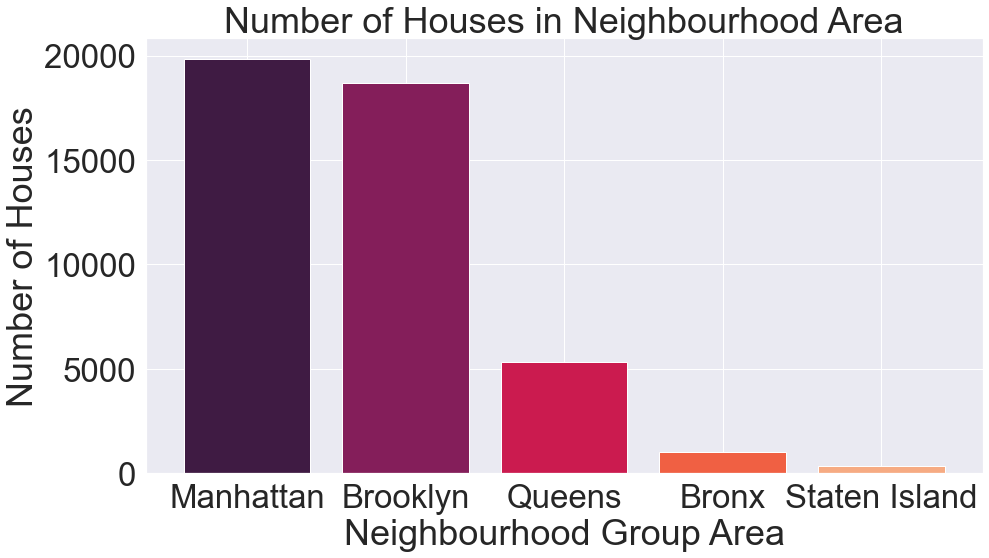

In [18]:
neighbourhood_groups = airbnbData['neighbourhood_group']
#Count the values 
neighbourhood_groups = neighbourhood_groups.value_counts()


title = "Number of Houses in Neighbourhood Area"
x_label = "Neighbourhood Group Area"
y_label = "Number of Houses"

print(neighbourhood_groups)
plot_bar(neighbourhood_groups, (15, 8), title, x_label, y_label)
#neighbourhood_groups.value_counts().plot(kind='bar')


As we can observe from the graph:
- Manhattan        19831 houses
- Brooklyn         18693 houses 
- Queens            5315 houses
- Bronx             1021 houses 
- Staten Island      344 houses


1776    1
1470    1
1691    1
2443    1
1818    1
3382    1
1706    1
1354    1
3665    1
2342    1
Name: neighbourhood, dtype: int64


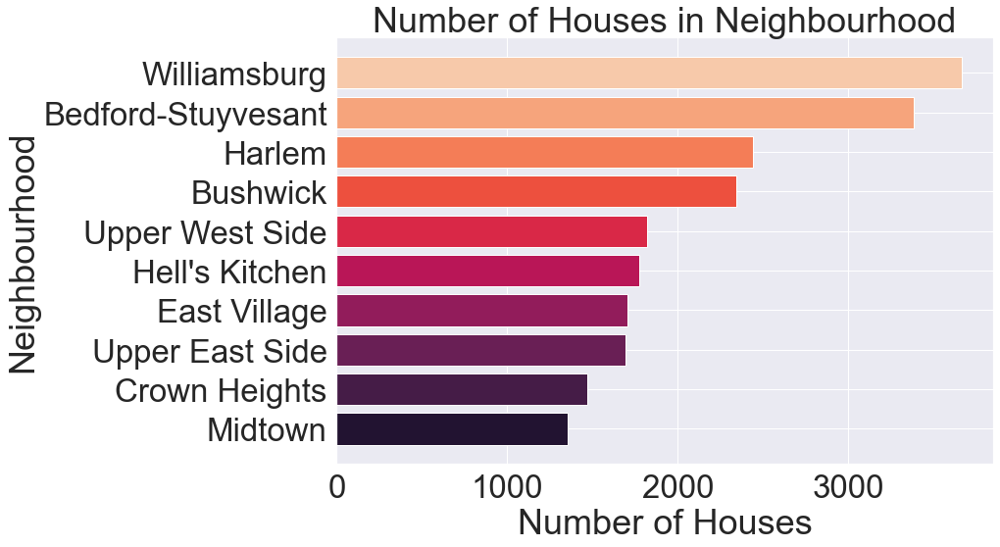

In [19]:
#Count the values 
neighbourhood = airbnbData['neighbourhood']
neighbourhood = neighbourhood.value_counts()[:10]
title = "Number of Houses in Neighbourhood"
y_label = "Neighbourhood"
x_label = "Number of Houses"

print(neighbourhood.value_counts()[:10])
plot_bar(neighbourhood, (12, 8), title, x_label, y_label, horizontal=True)

As we can observe from the graph:
- Williamsburg          3665 houses 
- Bedford-Stuyvesant    3382 houses
- Harlem                2443 houses 
- Bushwick              2342 houses
- Upper West Side       1818 houses
- Hell's Kitchen        1776 houses
- East Village          1706 houses
- Upper East Side       1691 houses
- Crown Heights         1470 houses
- Midtown               1354 houses


<b>Does this mean that are less houses in neighbourhood areas with lower houses than in higher ones?</b>

This analysis is based on the assumption that the number of rows are equal to the number of houses in airbnb, although this is true, there are many more people that do have a house, and do not use airbnb to rent it. 

Therefore the results are obtain from a subset of the population. However if you would take everyone who has a home, the results would change drastically.

## What is the types of rooms broken down by neighbourhood group?

We will use a scatter plot to represent the price of the room in a given area. 

Text(0.5, 1.0, 'Room Type vs Price vs Neighbourhood Group')

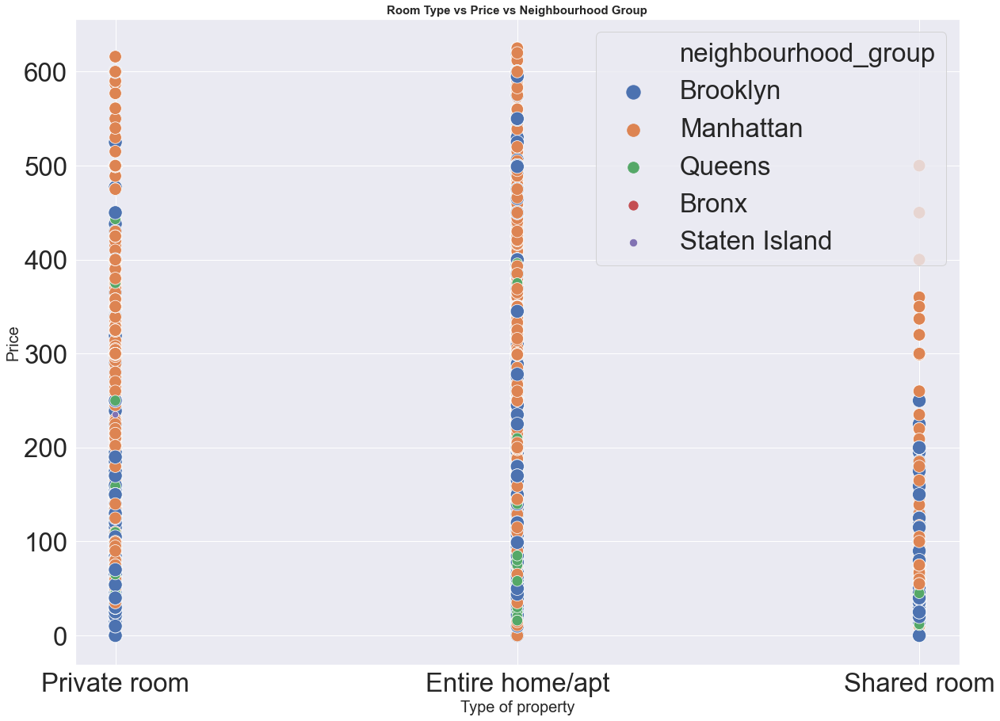

In [20]:
#plt.figure(figsize=(20,15))
plt.figure(figsize=(20, 15))

sns.scatterplot(x="room_type", y="price",
            hue="neighbourhood_group", size="neighbourhood_group",
            sizes=(70, 300), data=airbnbData)

plt.xlabel("Type of property", size=20)
plt.ylabel("Price", size=20)
plt.title("Room Type vs Price vs Neighbourhood Group",size=15, weight='bold')

## Do the neighbourhood and neighbourhood group have a correlation with the price of rent?

As we can observe, this gives us a good visualization of how the types of property rented differs between areas and between price, we can find the following conclusions:

#### 1. The price generally depends of the type of property being rented.
 We can observe that share rooms are less expensive than private rooms and entire home/apt. Another interesting thing is that an entire home/apt could be as expensive as a private room, as the number of points reaching 600 is slightly higher in entire home/apt than private room.

#### 2. The price generally depends of the area of the property is located in. 
We can observe than in areas such as Manhattan or Brooklyn, the price is much higher, even a share room could be more expensive than entire home/apt on other areas such as Queens or Staten Island. 

We can also see that in the case of Manhattan there are more houses in a price higher than in other areas therefore the average price is higher.

So far form what we have found from the different graphs, we can see there is a correlation between the price of rent and the area where the property is located in. 

However we can explore and analyse this further in order to understand price behaviours and be able to make price predictions

#### We are going to compare how the number of reviews change over the neighbourhood group and the price of bedrooms. This will tell us:
- how people from different areas behave in terms on reviews, areas and the price.
- This will allow us to see a different picture of the data.

Brooklyn
Manhattan
Queens
Bronx
Staten Island


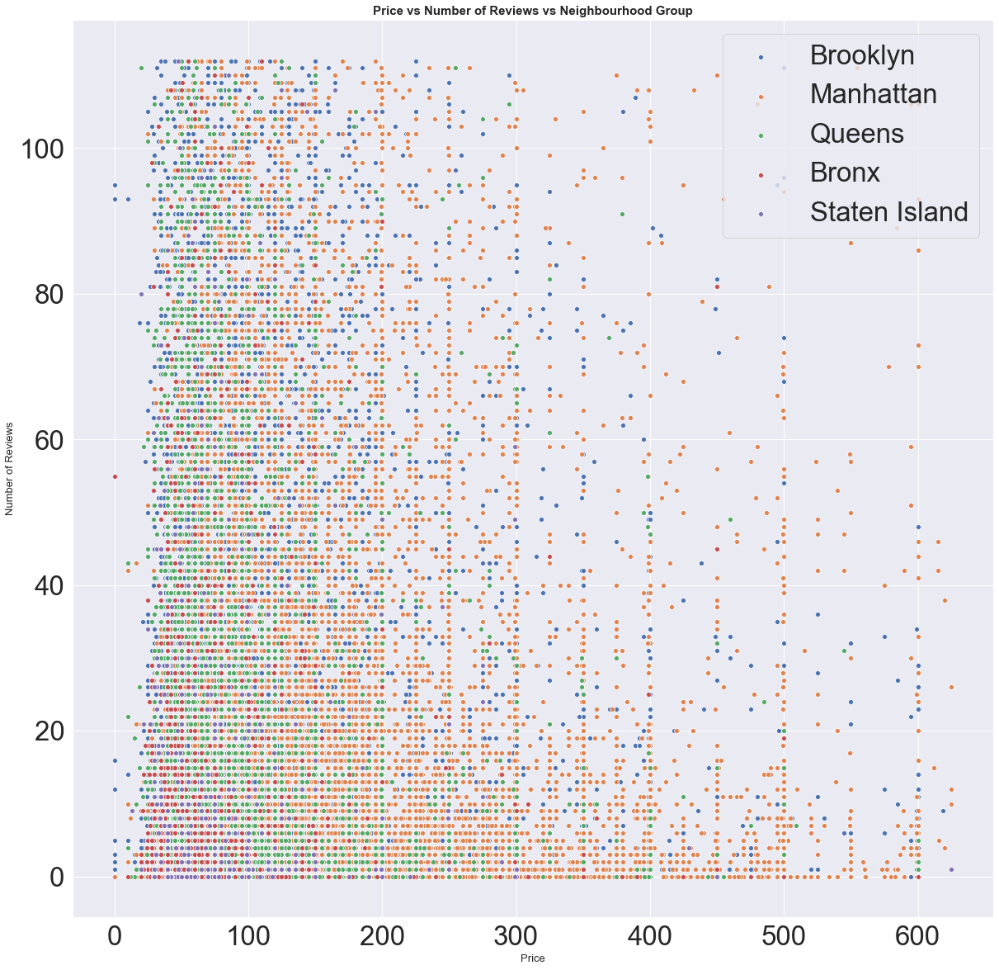

In [21]:

def plot_number_reviews_scatter(x, y, figsize, xlabel, ylabel , title):
    
    plt.figure(figsize=figsize)
    #color = sns.set_palette("Set1")
    for val in airbnbData.neighbourhood_group.unique():
        print(val)
        sns.scatterplot(x='price', y='number_of_reviews', palette=sns.color_palette("Set1"),
             data=airbnbData[airbnbData['neighbourhood_group']==val],
             label=val)
    
    plt.xlabel(xlabel, size=13)
    plt.ylabel(ylabel, size=13)
    plt.title(title,size=15, weight='bold')
    plt.show()
    
plot_number_reviews_scatter(x=priceCol, y=reviews, 
                            figsize=(20, 20),xlabel="Price", ylabel="Number of Reviews", 
                            title="Price vs Number of Reviews vs Neighbourhood Group")

As we can observe, we can see similar behaviour found in the price vs type of property vs Neighbourhood Area. 

We can observe the following things:

- As the price increases number of reviews decrese, therefore less people give reviews, also, the people who give the most reviews after 200 are generally from Manhattan. There are lower reviews given by people living in Manhattan in when the price is less than 150.

- Queens, Staten Island and Bronx reviews are mostly given when the price is less than 200, and there are a higher number of reviews given and from more diverse background. 

- Brooklyn State shows that the reviews of that state are less dependent on price, We can see that on that area people can find expensive locations as well as cheaper locations.  

# Price Prediction

In [22]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [23]:
airbnbData.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 45204 entries, 0 to 48894
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              45204 non-null  int64  
 1   name                            45204 non-null  object 
 2   host_id                         45204 non-null  int64  
 3   host_name                       45204 non-null  object 
 4   neighbourhood_group             45204 non-null  object 
 5   neighbourhood                   45204 non-null  object 
 6   latitude                        45204 non-null  float64
 7   longitude                       45204 non-null  float64
 8   room_type                       45204 non-null  object 
 9   price                           45204 non-null  int64  
 10  minimum_nights                  45204 non-null  int64  
 11  number_of_reviews               45204 non-null  int64  
 12  calculated_host_listings_count  

<Figure size 2160x2160 with 0 Axes>

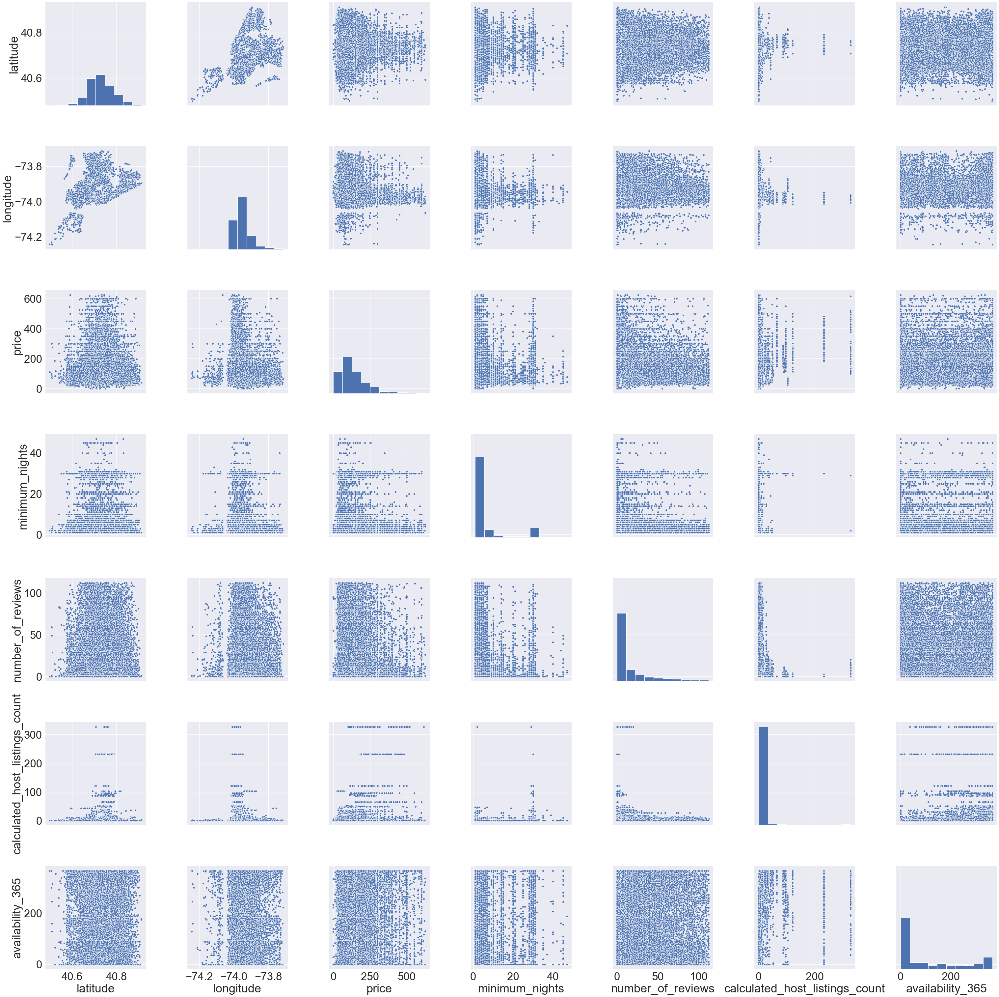

In [24]:
##Dropping columns we don't need
airbnbData.drop(['name', 'id', 'host_id', 'host_name'], axis=1, inplace=True)
plt.figure(figsize=(30, 30))
sns.pairplot(airbnbData, height=6, diag_kind="hist")



In [25]:
result = []

# Encoding non numeric columns.
neighbourhood_num = pd.get_dummies(airbnbData['neighbourhood'], drop_first=True)
neighbourhood_group_num = pd.get_dummies(airbnbData['neighbourhood_group'], drop_first=True)
room_type_num = pd.get_dummies(airbnbData['room_type'], drop_first=True)
    
X_modelling = pd.concat([airbnbData, neighbourhood_num, neighbourhood_group_num, room_type_num], axis=1)

print(X_modelling.shape)
X_modelling.head()

(45204, 234)


,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,...,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Brooklyn,Manhattan,Queens,Staten Island,Private room,Shared room
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,6,365,...,0,0,0,0,1,0,0,0,1,0
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2,355,...,0,0,0,0,0,1,0,0,0,0
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1,365,...,0,0,0,0,0,1,0,0,1,0
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,1,0,...,0,0,0,0,0,1,0,0,0,0
5,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,1,129,...,0,0,0,0,0,1,0,0,0,0


In [26]:
#Deleting all columns with text as the new ones have numbers
X_cols = X_modelling.columns[:5]
X_modelling.drop(['neighbourhood', 'neighbourhood_group', 'room_type'], axis=1, inplace=True)

In [27]:
#X.drop(['neighbourhood_group', 'neighbourhood', 'room_type'], axis=1, inplace=True)

X = X_modelling.drop(['price'], axis=1)
y = X_modelling['price']

X.head()
#print(X_cols)

,latitude,longitude,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,Arden Heights,Arrochar,Arverne,Astoria,...,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Brooklyn,Manhattan,Queens,Staten Island,Private room,Shared room
0,40.64749,-73.97237,1,9,6,365,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,40.75362,-73.98377,1,45,2,355,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,40.80902,-73.94190,3,0,1,365,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,40.79851,-73.94399,10,9,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,40.74767,-73.97500,3,74,1,129,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [30]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

#Encode categorical features

scaler = MinMaxScaler(feature_range=(0, 1))

X = scaler.fit_transform(X)
kfold_cv=KFold(n_splits=5, random_state=42, shuffle=False)
for train_index, test_index in kfold_cv.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

#Polinomial tried, but too slow    
#poly_model = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)


#X_train = poly_model.fit_transform(X_train)
#X_test = poly_model.fit_transform(X_test)
    
model = LinearRegression()


#model.fit(X_train, y_train)
grid_params = {'normalize': [True, False], 'fit_intercept': [True, False], 'copy_X': [True, False]}

grid_search = GridSearchCV(model, param_grid=grid_params, verbose=2, scoring='neg_mean_squared_error')

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = grid_search.best_score_
print(best_params)
print(best_score)


/Users/pedrojose/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] copy_X=True, fit_intercept=True, normalize=True .................
[CV] .. copy_X=True, fit_intercept=True, normalize=True, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=True .................
[CV] .. copy_X=True, fit_intercept=True, normalize=True, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=True .................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] .. copy_X=True, fit_intercept=True, normalize=True, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=True .................
[CV] .. copy_X=True, fit_intercept=True, normalize=True, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=True .................
[CV] .. copy_X=True, fit_intercept=True, normalize=True, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=False ................
[CV] . copy_X=True, fit_intercept=True, normalize=False, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=False ................
[CV] . copy_X=True, fit_intercept=True, normalize=False, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=False ................
[CV] . copy_X=True, fit_intercept=True, normalize=False, total=   0.1s
[CV] copy_X=True, fit_intercept=True, normalize=False ................
[CV] . copy_X=True, fit_intercept=True, normalize=False, total=   0.2s
[CV] copy_X=True, fit_intercept=True, normalize=False ................
[CV] .

[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    6.7s finished


{'copy_X': True, 'fit_intercept': True, 'normalize': False}
-6.402320891735832e+22


In [31]:
#linear_reg_model = LinearRegression(copy_X= True, fit_intercept = False, normalize = True)
#linear_reg_model.fit(X_train, y_train)
y_pred = grid_search.predict(X_test)
#reg=LinearRegression()
#reg.fit(X_train,y_train)
#y_pred=clf.predict(X_test)

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2_square =r2_score(y_test, y_pred)
    
print('MAE:', mae)
print('MSE:', mse)
print('RMSE:', rmse)
print('R2 Square', r2_square)

MAE: 513123311.87733716
MSE: 1.1900955673100125e+21
RMSE: 34497761772.46884
R2 Square -1.0134968799681098e+17


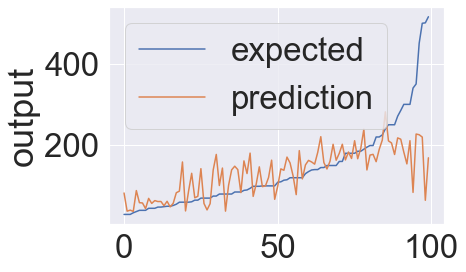

In [32]:
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred, 'y': y})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.plot(t['y'].tolist(), label='expected')
    plt.plot(t['pred'].tolist(), label='prediction')
    plt.ylabel('output')
    plt.legend()
    plt.show()

        
chart_regression(y_pred[:100], y_test[:100], sort=True) 

In [33]:
sns.set(font_scale=3)
plt.figure(figsize=(35, 25))
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

<Figure size 2520x1800 with 0 Axes>